# **Ensemble Learning for Mobile Price Classification: Leveraging LDA and Variance Threshold for Enhanced Accuracy**
## **Data Description**
1.  battery_power - Total energy a battery can store in one time measured in mAh
2.  blue - Has bluetooth or not
3.  clock_speed - speed at which microprocessor executes instructions
4.  dual_sim - Has dual sim support or not
5.  fc - Front Camera mega pixels
6.  four_g - Has 4G or not
7.  int_memory - Internal Memory in Gigabytes
8.  m_dep - Mobile Depth in cm
9.  mobile_wt - Weight of mobile phone
10. n_cores - Number of cores of processor
11. pc - Primary Camera mega pixels
12. px_height - Pixel Resolution Height
13. px_width - Pixel Resolution Width
14. ram - Random Access Memory in Mega Bytes
15. sc_h - Screen Height of mobile in cm
16. sc_w - Screen Width of mobile in cm
17. talk_time - longest time that a single battery charge will last when you are
18. three_g - Has 3G or not
19. touch_screen - Has touch screen or not
20. wifi - Has wifi or not
21. price_range - This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

## **Implementations**

1.  Data Extraction - Collected the data from Kaggle.
2.  Data Preprocessing - EDA using Pandas Profiling
3.  Feature Scaling - Standardization the entire data.
4.  Dimentionality Reduction Technique - LDA
5.  Feature Selection - Variance Threshold
6.  Data split - 80:20 split as Train-Test Split.
7.  Data Modeling - Ensemble Learning(Boosting algorithms - AdaBoost, Gradient Boosting, XGBoost, Light GBM)
8.  Model Evaluation - Calculated all the metrics using Confusion Matrix.
9.  Model Comparison - Compared the accuracy of all models.
10. Model validation techniques - Cross Validation of Each Model
11. Validation Comparison - Compared CrossValidation Score of all models.
12. Predictions on Test Set

# **Loading Required Libraries**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import sys
!{sys.executable} -m pip install -U pandas-profiling[notebook]
!jupyter nbextension enable --py widgetsnbextension
#import ydata_profiling
from ydata_profiling import ProfileReport

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 20.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 50.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=c8e61660c6c1c3e35a8c59be806e5c8364cad200c8b4a4bc3d76efc9fbb722b2
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: word

# ***1.  Data Extraction***

In [4]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [5]:
test.head()

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


In [6]:
test.drop(['id'],axis=1,inplace=True)

# ***2.  Data Preprocessing - EDA***

In [7]:
profile = ProfileReport(train, explorative = True, dark_mode= False )

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
profile.to_file('Mobile_Price_report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
train.shape

(2000, 21)

In [11]:
test.shape

(1000, 20)

In [12]:
x_train= train.drop(columns = ['price_range'], axis = 1) # Independent Features
y_train= train['price_range'] # Target Feature

In [13]:
x_test= test

In [15]:
print("x_train = ",x_train.shape)
print("y_train = ",y_train.shape)
print("x_test  = ",x_test.shape)

x_train =  (2000, 20)
y_train =  (2000,)
x_test  =  (1000, 20)


# ***3.  Feature Scaling - Standardization***

In [16]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [17]:
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.fit_transform(x_test)

In [18]:
x_train_scaled

array([[-0.90259726, -0.9900495 ,  0.83077942, ..., -1.78686097,
        -1.00601811,  0.98609664],
       [-0.49513857,  1.0100505 , -1.2530642 , ...,  0.55964063,
         0.99401789, -1.01409939],
       [-1.5376865 ,  1.0100505 , -1.2530642 , ...,  0.55964063,
         0.99401789, -1.01409939],
       ...,
       [ 1.53077336, -0.9900495 , -0.76274805, ...,  0.55964063,
         0.99401789, -1.01409939],
       [ 0.62252745, -0.9900495 , -0.76274805, ...,  0.55964063,
         0.99401789,  0.98609664],
       [-1.65833069,  1.0100505 ,  0.58562134, ...,  0.55964063,
         0.99401789,  0.98609664]])

In [19]:
# array to df

x_train_scaled=pd.DataFrame(x_train_scaled,columns=[x_train.columns])

x_test_scaled=pd.DataFrame(x_test_scaled,columns=[x_test.columns])

In [21]:
# save df to csv file

x_train_scaled.to_csv('train_scaled.csv')
x_test_scaled.to_csv('test_scaled.csv')

In [22]:
x_train_scaled = pd.read_csv('train_scaled.csv',index_col=0)
x_test_scaled = pd.read_csv('test_scaled.csv',index_col=0)

In [23]:
x_train_scaled

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,-0.902597,-0.990050,0.830779,-1.019184,-0.762495,-1.043966,-1.380644,0.340740,1.349249,-1.101971,-1.305750,-1.408949,-1.146784,0.391703,-0.784983,0.283103,1.462493,-1.786861,-1.006018,0.986097
1,-0.495139,1.010051,-1.253064,0.981177,-0.992890,0.957886,1.155024,0.687548,-0.120059,-0.664768,-0.645989,0.585778,1.704465,0.467317,1.114266,-0.635317,-0.734267,0.559641,0.994018,-1.014099
2,-1.537686,1.010051,-1.253064,0.981177,-0.532099,0.957886,0.493546,1.381165,0.134244,0.209639,-0.645989,1.392684,1.074968,0.441498,-0.310171,-0.864922,-0.368140,0.559641,0.994018,-1.014099
3,-1.419319,1.010051,1.198517,-1.019184,-0.992890,-1.043966,-1.215274,1.034357,-0.261339,0.646842,-0.151168,1.286750,1.236971,0.594569,0.876859,0.512708,-0.002014,0.559641,-1.006018,-1.014099
4,1.325906,1.010051,-0.395011,-1.019184,2.002254,0.957886,0.658915,0.340740,0.021220,-1.101971,0.673534,1.268718,-0.091452,-0.657666,-1.022389,-0.864922,0.730240,0.559641,0.994018,-1.014099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-1.011860,1.010051,-1.253064,0.981177,-0.992890,0.957886,-1.656260,1.034357,-0.967737,0.646842,0.673534,1.300273,1.477661,-1.342799,0.164641,-0.405712,1.462493,0.559641,0.994018,-1.014099
1996,1.653694,1.010051,1.321096,0.981177,-0.992890,-1.043966,0.383299,-1.046495,1.320993,-0.227564,-1.140810,0.608317,1.651235,-0.085031,-0.310171,0.971917,0.913303,0.559641,0.994018,0.986097
1997,1.530773,-0.990050,-0.762748,0.981177,-0.762495,0.957886,0.217930,0.687548,-0.911225,1.521249,-1.140810,0.502383,0.880565,0.860139,-0.784983,-1.094526,-1.100394,0.559641,0.994018,-1.014099
1998,0.622527,-0.990050,-0.762748,-1.019184,-0.071307,0.957886,0.769162,-1.393304,0.134244,0.209639,-0.810929,-0.696707,-1.345816,-1.157454,1.351672,0.971917,1.462493,0.559641,0.994018,0.986097


# ***4.  Dimentionality Reduction Technique - LDA***

In [24]:
# Initialize the LDA model
lda = LinearDiscriminantAnalysis(n_components=3)
lda

LinearDiscriminantAnalysis(n_components=3)

In [25]:
# Perform dimensionality reduction on training and testing data
X_train_lda = lda.fit_transform(x_train_scaled,y_train)
X_test_lda = lda.transform(x_test_scaled)

In [26]:
X_train_lda

array([[-0.71338765,  1.93162174, -1.15046376],
       [ 2.25940785, -2.04813391,  0.43536827],
       [ 1.39727136, -0.82583374, -0.96931692],
       ...,
       [ 4.72049711, -1.01243626,  0.68613602],
       [-4.14940173, -0.38460647,  0.49352055],
       [ 3.63526164,  0.57082502,  0.98950804]])

In [27]:
# Create a DataFrame for visualization
X_train_lda  = pd.DataFrame(X_train_lda, columns=['LDA1', 'LDA2','LDA3'])
#X_train_lda['Price Range'] = y_train

In [28]:
X_train_lda

,LDA1,LDA2,LDA3
0,-0.713388,1.931622,-1.150464
1,2.259408,-2.048134,0.435368
2,1.397271,-0.825834,-0.969317
3,1.985861,0.828608,-0.210469
4,-0.608285,-1.519153,-2.053028
...,...,...,...
1995,-4.074443,-1.641757,-0.785789
1996,1.608167,-0.703323,0.030761
1997,4.720497,-1.012436,0.686136
1998,-4.149402,-0.384606,0.493521


In [29]:
X_test_lda  = pd.DataFrame(X_test_lda, columns=['LDA1', 'LDA2','LDA3'])
# lda_test['Price Range'] = y_test

In [30]:
X_test_lda

,LDA1,LDA2,LDA3
0,3.249088,1.517682,0.639756
1,4.469438,0.993196,-1.229188
2,2.182412,-1.169365,-0.320060
3,6.314877,-0.053236,0.650821
4,-0.880240,-0.051884,0.660415
...,...,...,...
995,0.490357,-0.499233,0.782162
996,-1.257989,0.021402,-2.164219
997,-3.290635,-0.049875,-0.901053
998,0.611297,-0.498898,1.181678


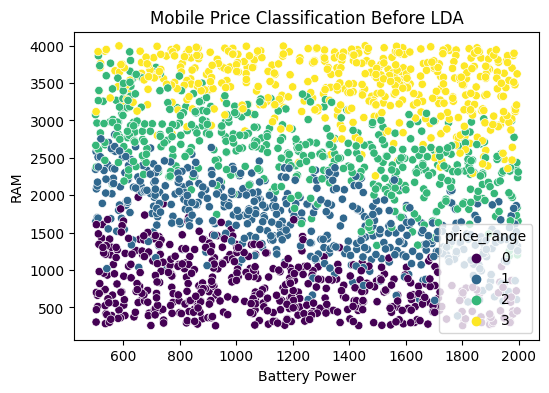

In [34]:
# Plot before LDA
plt.figure(figsize=(6, 4))
sns.scatterplot(data=x_train , x='battery_power', y='ram', hue= y_train , palette='viridis')
plt.title('Mobile Price Classification Before LDA')
plt.xlabel('Battery Power')
plt.ylabel('RAM')
plt.show()

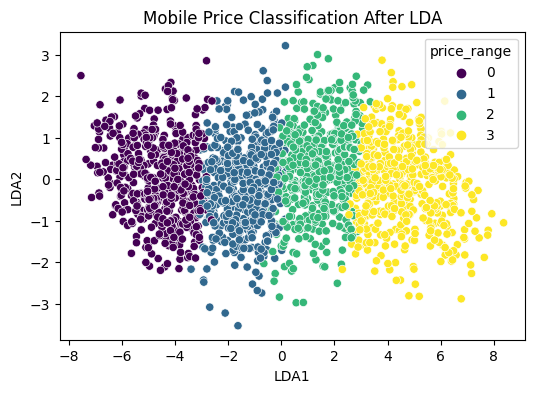

In [35]:
# Plot after LDA
plt.figure(figsize=(6, 4))
sns.scatterplot(data= X_train_lda, x='LDA1', y='LDA2', hue= y_train , palette='viridis')
plt.title('Mobile Price Classification After LDA')
plt.xlabel('LDA1')
plt.ylabel('LDA2')
plt.show()

In [36]:
final_train = pd.concat([x_train_scaled,X_train_lda],axis=1)
final_test = pd.concat([x_test_scaled ,X_test_lda],axis=1)

In [37]:
final_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,LDA1,LDA2,LDA3
0,-0.902597,-0.990050,0.830779,-1.019184,-0.762495,-1.043966,-1.380644,0.340740,1.349249,-1.101971,...,0.391703,-0.784983,0.283103,1.462493,-1.786861,-1.006018,0.986097,-0.713388,1.931622,-1.150464
1,-0.495139,1.010051,-1.253064,0.981177,-0.992890,0.957886,1.155024,0.687548,-0.120059,-0.664768,...,0.467317,1.114266,-0.635317,-0.734267,0.559641,0.994018,-1.014099,2.259408,-2.048134,0.435368
2,-1.537686,1.010051,-1.253064,0.981177,-0.532099,0.957886,0.493546,1.381165,0.134244,0.209639,...,0.441498,-0.310171,-0.864922,-0.368140,0.559641,0.994018,-1.014099,1.397271,-0.825834,-0.969317
3,-1.419319,1.010051,1.198517,-1.019184,-0.992890,-1.043966,-1.215274,1.034357,-0.261339,0.646842,...,0.594569,0.876859,0.512708,-0.002014,0.559641,-1.006018,-1.014099,1.985861,0.828608,-0.210469
4,1.325906,1.010051,-0.395011,-1.019184,2.002254,0.957886,0.658915,0.340740,0.021220,-1.101971,...,-0.657666,-1.022389,-0.864922,0.730240,0.559641,0.994018,-1.014099,-0.608285,-1.519153,-2.053028
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-1.011860,1.010051,-1.253064,0.981177,-0.992890,0.957886,-1.656260,1.034357,-0.967737,0.646842,...,-1.342799,0.164641,-0.405712,1.462493,0.559641,0.994018,-1.014099,-4.074443,-1.641757,-0.785789
1996,1.653694,1.010051,1.321096,0.981177,-0.992890,-1.043966,0.383299,-1.046495,1.320993,-0.227564,...,-0.085031,-0.310171,0.971917,0.913303,0.559641,0.994018,0.986097,1.608167,-0.703323,0.030761
1997,1.530773,-0.990050,-0.762748,0.981177,-0.762495,0.957886,0.217930,0.687548,-0.911225,1.521249,...,0.860139,-0.784983,-1.094526,-1.100394,0.559641,0.994018,-1.014099,4.720497,-1.012436,0.686136
1998,0.622527,-0.990050,-0.762748,-1.019184,-0.071307,0.957886,0.769162,-1.393304,0.134244,0.209639,...,-1.157454,1.351672,0.971917,1.462493,0.559641,0.994018,0.986097,-4.149402,-0.384606,0.493521


# ***5.  Feature Selection - Variance Threshold***

In [38]:
threshold = VarianceThreshold(threshold=1)
threshold.fit(final_train)


VarianceThreshold(threshold=1)

In [39]:
# true- non zero var
# false - 0 var
threshold.get_support()

array([False,  True, False, False,  True,  True, False, False,  True,
       False, False, False, False, False,  True, False, False, False,
       False, False,  True,  True,  True])

In [40]:
# finding non constant feature (true value)
sum(threshold.get_support())

8

In [41]:
# true- non zero var
final_train.columns[threshold.get_support()]

Index(['blue', 'fc', 'four_g', 'mobile_wt', 'sc_h', 'LDA1', 'LDA2', 'LDA3'], dtype='object')

In [42]:
# false - 0 var

constant_cols=[column for column in final_train.columns
              if column not in final_train.columns[threshold.get_support()]]
print(constant_cols)
print()
print("Length of non constant features = ",len(constant_cols))

['battery_power', 'clock_speed', 'dual_sim', 'int_memory', 'm_dep', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']

Length of non constant features =  15


In [43]:
for feature in constant_cols:
    print(feature)

battery_power
clock_speed
dual_sim
int_memory
m_dep
n_cores
pc
px_height
px_width
ram
sc_w
talk_time
three_g
touch_screen
wifi


In [44]:
final_train.drop(constant_cols,axis=1,inplace=True )

In [45]:
final_train.head()

,blue,fc,four_g,mobile_wt,sc_h,LDA1,LDA2,LDA3
0,-0.990050,-0.762495,-1.043966,1.349249,-0.784983,-0.713388,1.931622,-1.150464
1,1.010051,-0.992890,0.957886,-0.120059,1.114266,2.259408,-2.048134,0.435368
2,1.010051,-0.532099,0.957886,0.134244,-0.310171,1.397271,-0.825834,-0.969317
3,1.010051,-0.992890,-1.043966,-0.261339,0.876859,1.985861,0.828608,-0.210469
4,1.010051,2.002254,0.957886,0.021220,-1.022389,-0.608285,-1.519153,-2.053028


import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_2989330535553833158, *['blue'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_2989330535553833158, *['fc'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_2989330535553833158, *['four_g'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_2989330535553833158, *['mobile_wt'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2989330535553833158, *['blue'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2989330535553833158, *['fc'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2989330535553833158, *['four_g'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2989330535553833158, *['mobile_wt'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_2989330535553833158, *[[['blue', 'fc'], ['fc', 'four_g'], ['four_g', 'mobile_wt'], ['mobile_wt', 'sc_h']]], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_2989330535553833158, *['blue', 'fc', None], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_2989330535553833158, *['blue', 'four_g', None], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_2989330535553833158, *['blue', 'mobile_wt', None], **{})
chart

import numpy as np
from google.colab import autoviz
df_2989330535553833158 = autoviz.get_df('df_2989330535553833158')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_2989330535553833158, *['blue', 'sc_h', None], **{})
chart

In [46]:
final_test.drop(constant_cols,axis=1,inplace=True )

In [47]:
final_test.head()

,blue,fc,four_g,mobile_wt,sc_h,LDA1,LDA2,LDA3
0,0.968496,2.108676,-0.974329,1.535535,0.001158,3.249088,1.517682,0.639756
1,0.968496,-0.132927,1.026347,1.478120,-1.388231,4.469438,0.993196,-1.229188
2,0.968496,-0.805408,-0.974329,1.334582,1.158982,2.182412,-1.169365,-0.320060
3,-1.032529,3.005317,1.026347,-1.249091,-0.461972,6.314877,-0.053236,0.650821
4,-1.032529,1.436195,1.026347,-0.904602,0.695852,-0.880240,-0.051884,0.660415


# ***6.  Data split***

In [48]:
X_train,X_test,Y_train,Y_test = train_test_split(final_train, y_train, stratify=y_train, test_size = 0.2,random_state = 42)

In [49]:
print("X_train = ",X_train.shape)
print("X_test  = ",X_test.shape)
print("Y_train = ",Y_train.shape)
print("Y_test  = ",Y_test.shape)

X_train =  (1600, 8)
X_test  =  (400, 8)
Y_train =  (1600,)
Y_test  =  (400,)


# ***7.  Data Modeling - Ensemble Learning (Boosting algorithms)***
# ***AdaBoost***

In [51]:
from sklearn.ensemble import AdaBoostClassifier

In [52]:
AdaBoost = AdaBoostClassifier()
AdaBoost.fit(X_train, Y_train)

AdaBoostClassifier()

In [53]:
y_predict_train_AdaBoost = AdaBoost.predict(X_train)
y_predict_test_AdaBoost = AdaBoost.predict(X_test)

In [54]:
train_accuracy_score_AdaBoost = accuracy_score(Y_train, y_predict_train_AdaBoost)
test_accuracy_score_AdaBoost = accuracy_score(Y_test, y_predict_test_AdaBoost)
print('train_accuracy_score = ',train_accuracy_score_AdaBoost)
print('test_accuracy_score = ',test_accuracy_score_AdaBoost)

train_accuracy_score =  0.715625
test_accuracy_score =  0.7325


# ***8.  Model Evaluation - Confusion Matrix***

In [55]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(6,4))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='summer')
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

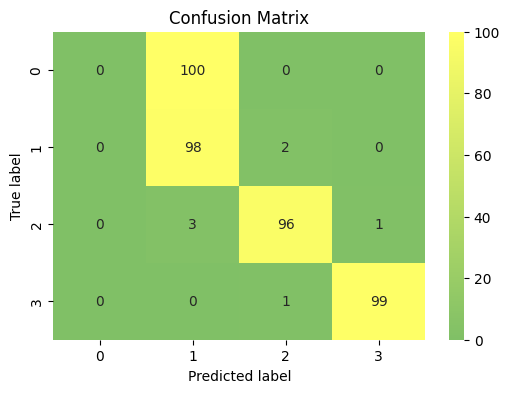


Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         0
           1       0.98      0.49      0.65       201
           2       0.96      0.97      0.96        99
           3       0.99      0.99      0.99       100

    accuracy                           0.73       400
   macro avg       0.73      0.61      0.65       400
weighted avg       0.98      0.73      0.81       400



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [56]:
cm_AdaBoost = confusion_matrix(Y_test,y_predict_test_AdaBoost)
draw_confusion_matrix(cm_AdaBoost)
print("\nClassification Report:\n%s"%classification_report(y_predict_test_AdaBoost,Y_test))

# ***Gradient Boosting (GBM)***

In [57]:
from sklearn.ensemble import GradientBoostingClassifier

In [58]:
Grad_Boost= GradientBoostingClassifier(learning_rate=0.01,random_state=1)
Grad_Boost.fit(X_train, Y_train)

GradientBoostingClassifier(learning_rate=0.01, random_state=1)

In [59]:
y_predict_train_Grad_Boost = Grad_Boost.predict(X_train)
y_predict_test_Grad_Boost = Grad_Boost.predict(X_test)

In [60]:
train_accuracy_score_Grad_Boost = accuracy_score(Y_train, y_predict_train_Grad_Boost)
test_accuracy_score_Grad_Boost = accuracy_score(Y_test, y_predict_test_Grad_Boost)
print('train_accuracy_score = ',train_accuracy_score_Grad_Boost)
print('test_accuracy_score = ',test_accuracy_score_Grad_Boost)

train_accuracy_score =  0.9675
test_accuracy_score =  0.9725


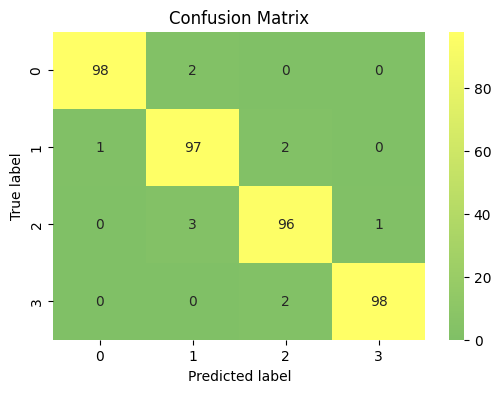


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        99
           1       0.97      0.95      0.96       102
           2       0.96      0.96      0.96       100
           3       0.98      0.99      0.98        99

    accuracy                           0.97       400
   macro avg       0.97      0.97      0.97       400
weighted avg       0.97      0.97      0.97       400



In [61]:
cm_Grad_Boost = confusion_matrix(Y_test,y_predict_test_Grad_Boost)
draw_confusion_matrix(cm_Grad_Boost)
print("\nClassification Report:\n%s"%classification_report(y_predict_test_Grad_Boost,Y_test))

#  ***XGBoost (extreme Gradient Boosting)***

In [62]:
import xgboost as xgb

In [63]:
xgboost = xgb.XGBClassifier(random_state=1,learning_rate=0.01)
xgboost.fit(X_train, Y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [64]:
y_predict_train_xgboost = xgboost.predict(X_train)
y_predict_test_xgboost = xgboost.predict(X_test)

In [65]:
train_accuracy_score_xgboost = accuracy_score(Y_train, y_predict_train_xgboost)
test_accuracy_score_xgboost = accuracy_score(Y_test, y_predict_test_xgboost)
print('train_accuracy_score = ',train_accuracy_score_xgboost)
print('test_accuracy_score = ',test_accuracy_score_xgboost)

train_accuracy_score =  0.981875
test_accuracy_score =  0.97


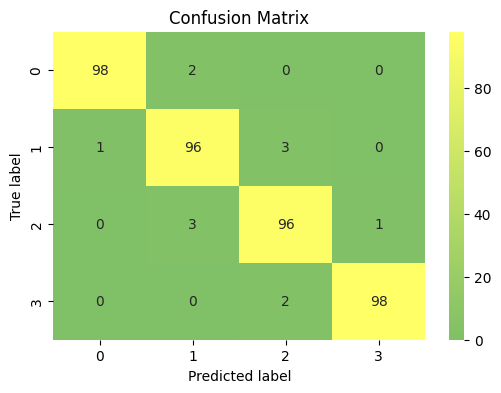


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98        99
           1       0.96      0.95      0.96       101
           2       0.96      0.95      0.96       101
           3       0.98      0.99      0.98        99

    accuracy                           0.97       400
   macro avg       0.97      0.97      0.97       400
weighted avg       0.97      0.97      0.97       400



In [66]:
cm_xgboost = confusion_matrix(Y_test,y_predict_test_xgboost)
draw_confusion_matrix(cm_xgboost)
print("\nClassification Report:\n%s"%classification_report(y_predict_test_xgboost,Y_test))

# ***Light GBM (Light Gradient Boosting Machine)***

In [67]:
from lightgbm import LGBMClassifier

In [68]:
lgbm = LGBMClassifier()
lgbm.fit(X_train, Y_train)

LGBMClassifier()

In [69]:
y_predict_train_lgbm = lgbm.predict(X_train)
y_predict_test_lgbm = lgbm.predict(X_test)

In [70]:
train_accuracy_score_lgbm = accuracy_score(Y_train, y_predict_train_lgbm)
test_accuracy_score_lgbm = accuracy_score(Y_test, y_predict_test_lgbm)
print('train_accuracy_score = ',train_accuracy_score_lgbm)
print('test_accuracy_score = ',test_accuracy_score_lgbm)

train_accuracy_score =  1.0
test_accuracy_score =  0.965


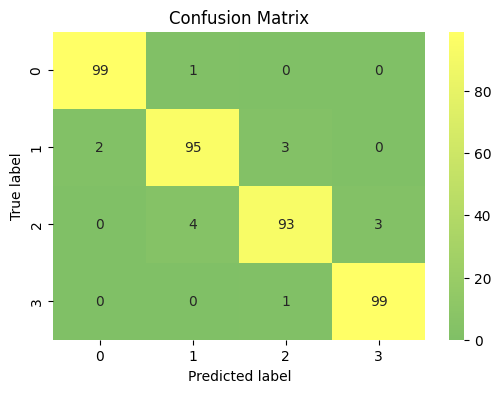


Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.98      0.99       101
           1       0.95      0.95      0.95       100
           2       0.93      0.96      0.94        97
           3       0.99      0.97      0.98       102

    accuracy                           0.96       400
   macro avg       0.97      0.96      0.96       400
weighted avg       0.97      0.96      0.97       400



In [71]:
cm_lgbm = confusion_matrix(Y_test,y_predict_test_lgbm)
draw_confusion_matrix(cm_lgbm)
print("\nClassification Report:\n%s"%classification_report(y_predict_test_lgbm,Y_test))

# ***9.  Model Comparison***

In [72]:
results=pd.DataFrame({'Boosting algorithms':['AdaBoost','Gradient Boosting','XGBoost','Light GBM'],
                      'Accuracy in Train':[train_accuracy_score_AdaBoost,train_accuracy_score_Grad_Boost,train_accuracy_score_xgboost,train_accuracy_score_lgbm],
                    'Accuracy in Test':[test_accuracy_score_AdaBoost,test_accuracy_score_Grad_Boost,test_accuracy_score_xgboost,test_accuracy_score_lgbm]})
result_df=results.sort_values(by='Accuracy in Test', ascending=False)
result_df=result_df.set_index('Boosting algorithms')
result_df

,Accuracy in Train,Accuracy in Test
Boosting algorithms,,
Gradient Boosting,0.967500,0.9725
XGBoost,0.981875,0.9700
Light GBM,1.000000,0.9650
AdaBoost,0.715625,0.7325


import numpy as np
from google.colab import autoviz
df_4944920111574853979 = autoviz.get_df('df_4944920111574853979')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_4944920111574853979, *['Accuracy in Train'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4944920111574853979 = autoviz.get_df('df_4944920111574853979')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_4944920111574853979, *['Accuracy in Test'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4944920111574853979 = autoviz.get_df('df_4944920111574853979')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_4944920111574853979, *['Accuracy in Train'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4944920111574853979 = autoviz.get_df('df_4944920111574853979')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_4944920111574853979, *['Accuracy in Test'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4944920111574853979 = autoviz.get_df('df_4944920111574853979')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_4944920111574853979, *[[['Accuracy in Train', 'Accuracy in Test']]], **{})
chart

# ***10. Model validation techniques - Cross Validation***

In [73]:
Skfold = StratifiedKFold(n_splits=10)
xyz = []
accuracy=[]
classifiers=['AdaBoost','Gradient Boosting','XGBoost','Light GBM']
models=[AdaBoostClassifier(),
    GradientBoostingClassifier(learning_rate=0.01,random_state=1),
    xgb.XGBClassifier(random_state=1,learning_rate=0.01),
    LGBMClassifier()]

for i in models:
    model = i
    cv_result = cross_val_score(model,X_train, Y_train, cv = Skfold, scoring = "accuracy")
    cv_result=cv_result
    xyz.append(cv_result.mean())
    accuracy.append(cv_result)

cv_models_dataframe=pd.DataFrame(xyz, index=classifiers)
cv_models_dataframe.columns=['CV Mean']
cv_models_dataframe
cv_models_dataframe.sort_values(['CV Mean'], ascending=[0])

,CV Mean
Light GBM,0.955625
Gradient Boosting,0.952500
XGBoost,0.951250
AdaBoost,0.713750


# ***11. Validation Comparison***

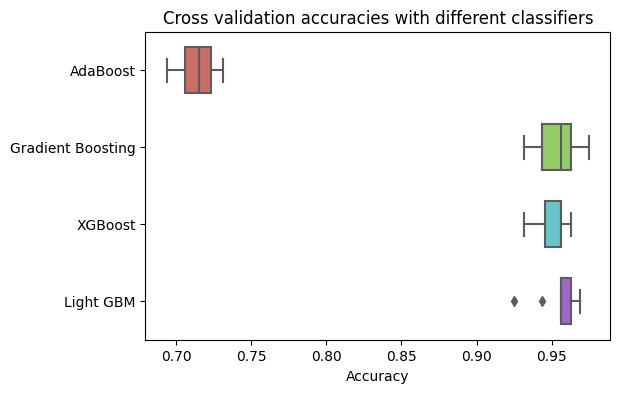

In [74]:
box=pd.DataFrame(accuracy,index=[classifiers])
boxT = box.T
plt.figure(figsize = (6, 4))
ax = sns.boxplot(data=boxT, orient="h", palette="hls", width=.6)
ax.set_yticklabels(classifiers)
ax.set_title('Cross validation accuracies with different classifiers')
ax.set_xlabel('Accuracy')
plt.show()

# ***12. Predictions on Test Set***

In [75]:
lgbm.predict(final_test)

array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 3, 0, 2, 0, 3, 0, 0, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 3, 0, 3, 1, 3, 1, 0, 3, 3, 3, 0, 1, 1, 1,
       1, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 1, 2, 0, 2, 2, 1, 2, 1, 3, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 2, 1, 2, 0, 3, 2, 2, 1, 0, 2,
       1, 1, 3, 1, 1, 0, 3, 2, 1, 2, 1, 2, 2, 3, 3, 3, 2, 3, 2, 3, 1, 0,
       3, 2, 3, 3, 3, 3, 3, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       0, 0, 1, 2, 1, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       3, 3, 1, 2, 2, 2, 3, 2, 2, 1, 1, 0, 1, 3, 1, 2, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 2, 0, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 2, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 1, 2, 3, 1, 1, 3, 2, 0, 3, 0, 1, 2, 1, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 1, 2, 1, 2, 0, 2, 3, 1,

# ***Conclusion***
- Gradient Boosting appears to strike a good balance between train and test accuracy, making it a strong candidate for this classification problem.
- Light GBM achieved perfect accuracy in the train dataset, which could indicate potential overfitting. However, they managed to maintain strong performance in the test dataset.
- To over come overfitting, Cross Validation applied & conclude that Gradient Boosting, XGBoost, and Light GBM are all promising options for mobile price classification, as they consistently demonstrated high accuracy across different evaluation scenarios.